# Preprocessing Images for ocr

1. Inverted Images
2. Rescaling
3. Binarization
4. Noise Removal
5. Dilation and Erosion
6. Rotation / Deskewing
7. Removing Borders
8. Missing Borders
9. Transparency / Alpha Channel

## 00: Opening an image

In [16]:
import cv2 
from PIL import Image
from matplotlib import pyplot as plt
image_file = "page_01.jpg"
img = cv2.imread(image_file)

In [17]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

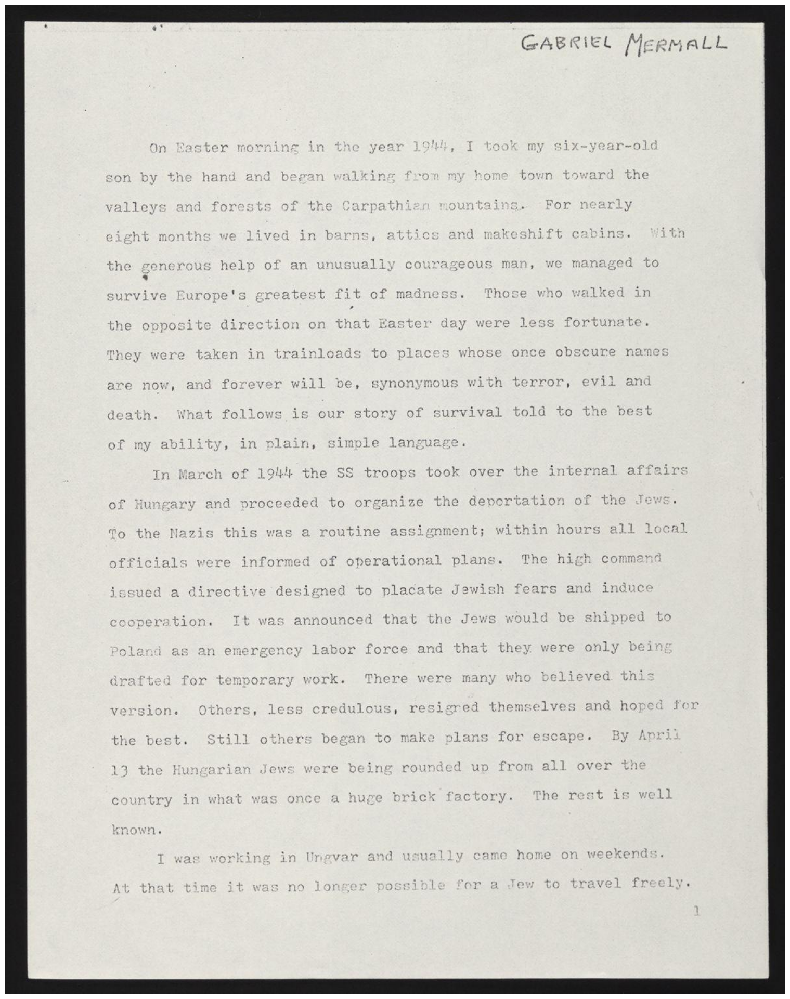

In [18]:
display(image_file)

## 01: Inverted Image

In [19]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg",inverted_image)

True

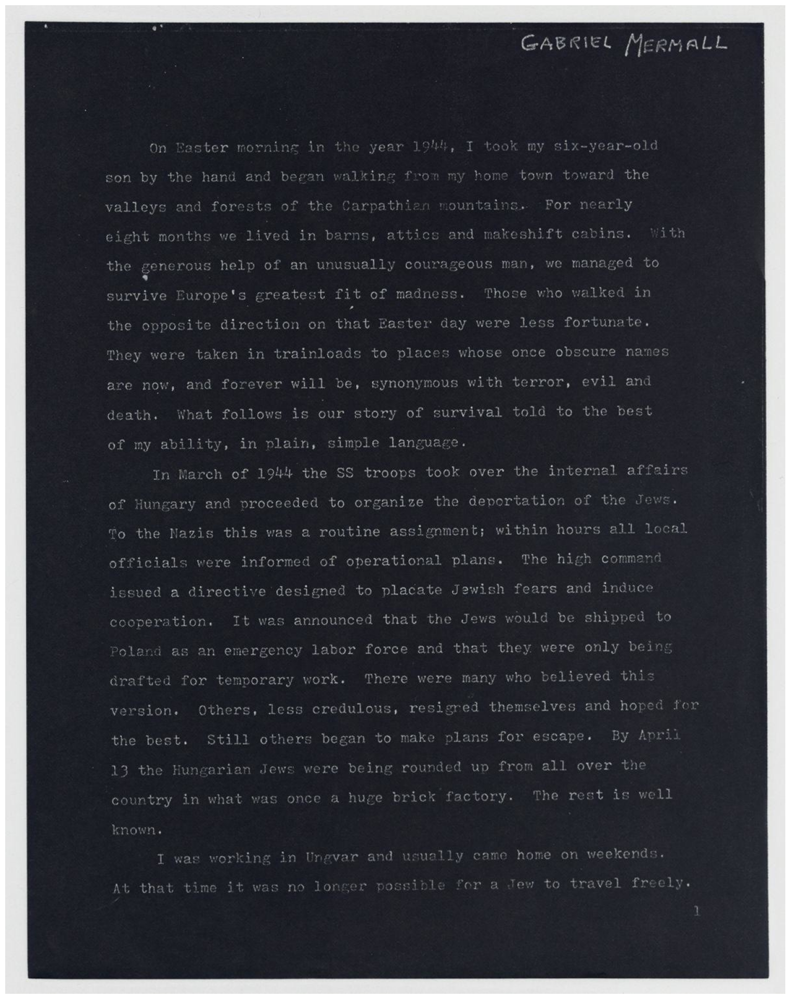

In [20]:
display("temp/inverted.jpg")

## 02: Rescaling

## 04: Binarization

In [21]:
def grayscale(image):
    return cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [22]:
gray_image = grayscale(img)
cv2.imwrite("temp/gray.jpg",gray_image)

True

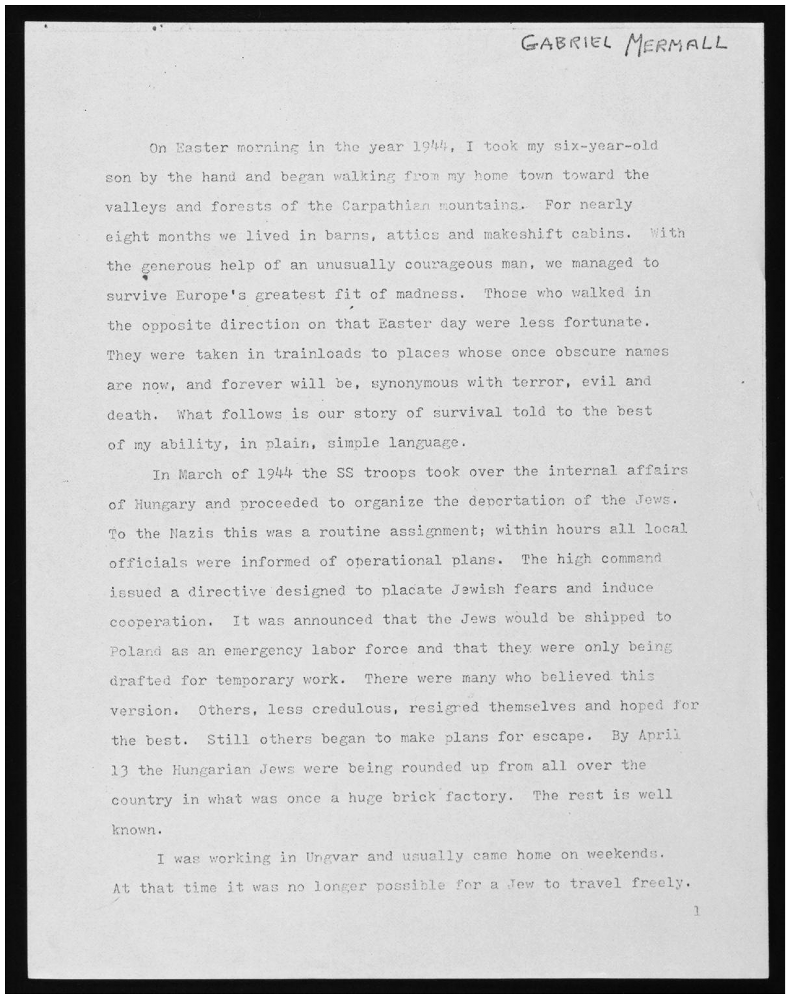

In [23]:
display("temp/gray.jpg")

In [24]:
thresh ,im_bw = cv2.threshold(gray_image,210,230,cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg",im_bw)

True

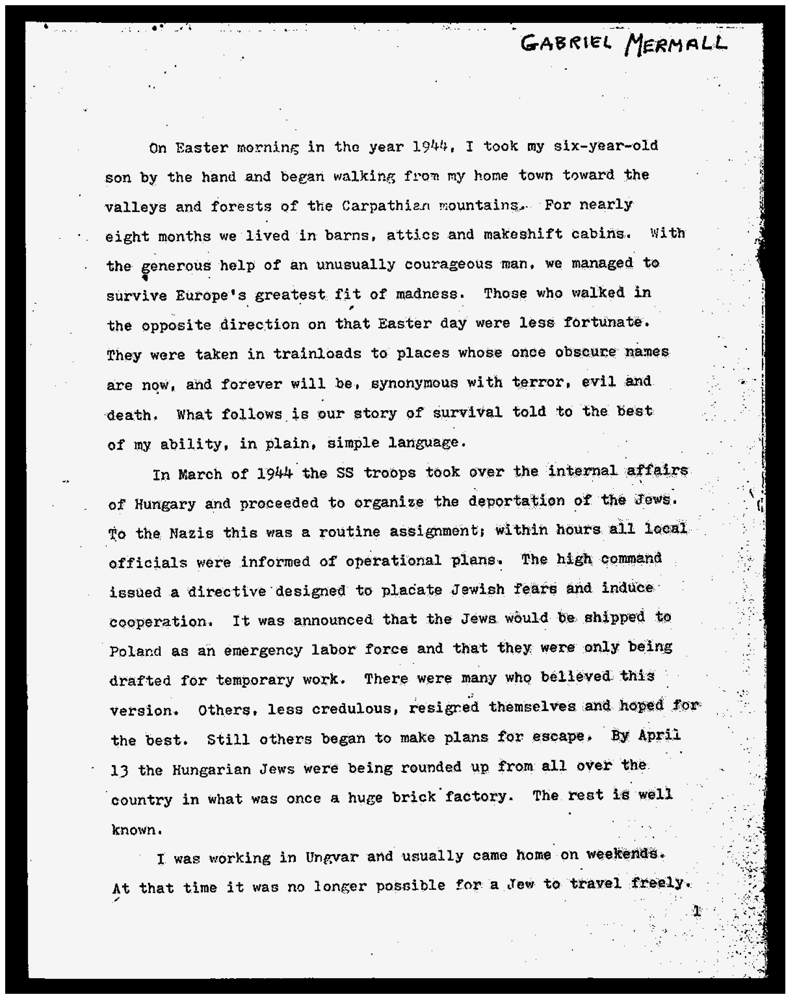

In [25]:
display("temp/bw_image.jpg")

## 04: Noise removal

In [26]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1,1),np.uint8)
    image = cv2.dilate(image,kernel,iterations=1)
    kernel = np.ones((1,1),np.uint8)
    image = cv2.erode(image,kernel,iterations=1)
    image = cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel)
    image = cv2.medianBlur(image,3)
    return (image)

In [27]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg",no_noise)

True

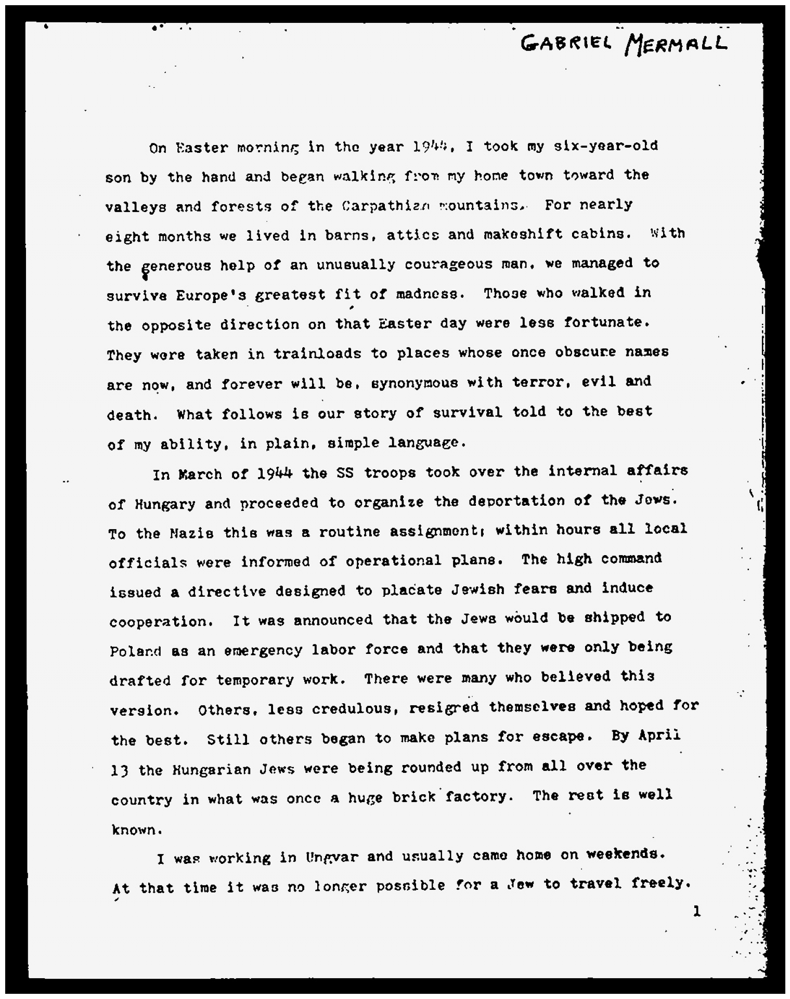

In [28]:
display("temp/no_noise.jpg")

## 05: Dilation and Erosion

### Erosion

In [31]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image,kernel,iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [32]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg",eroded_image)

True

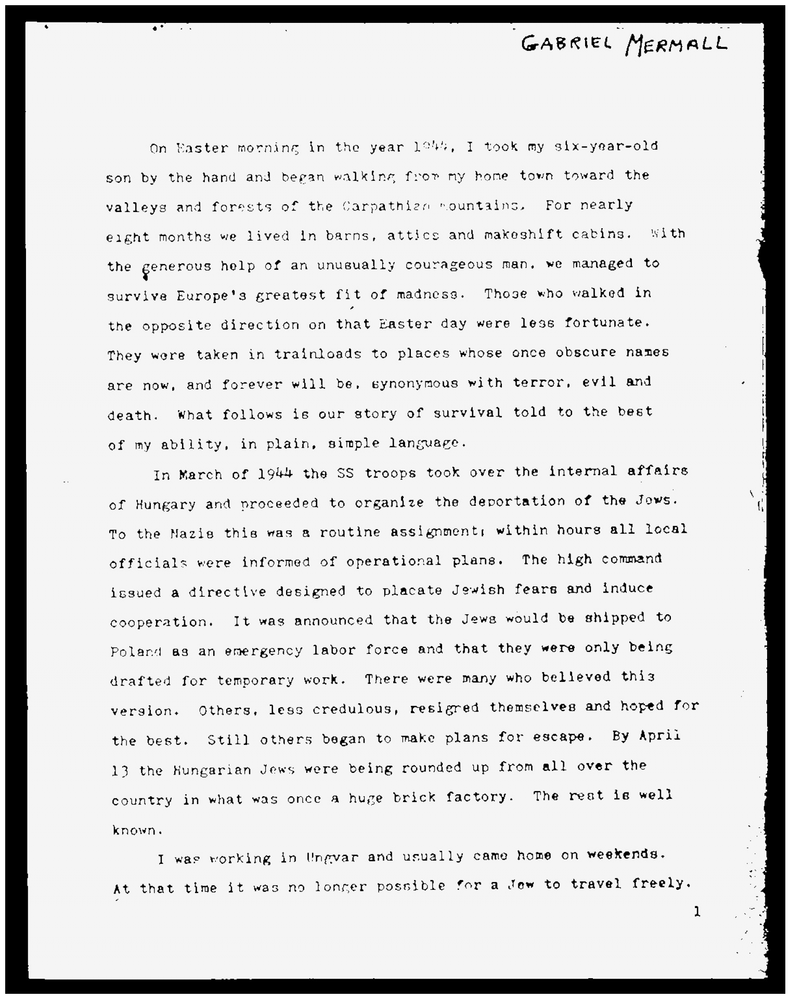

In [33]:
display("temp/eroded_image.jpg")